# Create annotations

Zoë Steier

* Dataset: SLN-all (mouse spleen and lymph node, two days, two panels)
* Annotate cell types based on clusters in totalVI latent space

## Imports and settings

In [1]:
# Import required packages

import os
import seaborn as sns
import numpy as np
import torch

from scvi.dataset import CellMeasurement, AnnDatasetFromAnnData, GeneExpressionDataset
from scvi.models import TOTALVI
from scvi.inference import TotalPosterior, TotalTrainer

import anndata
import scanpy as sc
import pandas as pd

from scvi import set_seed
import matplotlib.pyplot as plt

set_seed(0)

In [2]:
# Plotting settings

colors = ["#3B7EA1", "#FDB515", "#D9661F", "#859438", "#EE1F60", "#00A598"]
sns.set_palette(sns.color_palette(colors))
sns.set(context="notebook", font_scale=1.3, style="ticks") # notebook

sns.set_palette(sns.color_palette(colors))
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['savefig.transparent'] = True
sc.settings._vector_friendly = True
DPI = 300

## Load data

In [3]:
post_adata = anndata.read("/data/yosef2/users/zsteier/totalVI/totalVI_journal/spleen_lymph_all/totalVI/sln_all_intersect_results_post_adata.h5ad")

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [11]:
post_adata

AnnData object with n_obs × n_vars = 32648 × 4005 
    obs: 'leiden_totalVI_1.0', 'leiden_totalVI_0.8', 'leiden_totalVI_0.6', 'leiden_totalVI_0.4', 'starter_leiden_subclusters', 'starter_annotations', 'batch_indices', 'n_genes', 'n_protein_counts', 'n_proteins', 'percent_mito', 'seurat_hash_id', 'ADT_CD102_A0104_fore_prob', 'ADT_CD102_A0104', 'ADT_CD103_A0201_fore_prob', 'ADT_CD103_A0201', 'ADT_CD106_A0226_fore_prob', 'ADT_CD106_A0226', 'ADT_CD115(CSF-1R)_A0105_fore_prob', 'ADT_CD115(CSF-1R)_A0105', 'ADT_CD117(c-Kit)_A0012_fore_prob', 'ADT_CD117(c-Kit)_A0012', 'ADT_CD11a_A0595_fore_prob', 'ADT_CD11a_A0595', 'ADT_CD11c_A0106_fore_prob', 'ADT_CD11c_A0106', 'ADT_CD122(IL-2Rb)_A0227_fore_prob', 'ADT_CD122(IL-2Rb)_A0227', 'ADT_CD127(IL-7Ra)_A0198_fore_prob', 'ADT_CD127(IL-7Ra)_A0198', 'ADT_CD134(OX-40)_A0195_fore_prob', 'ADT_CD134(OX-40)_A0195', 'ADT_CD135_A0098_fore_prob', 'ADT_CD135_A0098', 'ADT_CD137_A0194_fore_prob', 'ADT_CD137_A0194', 'ADT_CD140a_A0573_fore_prob', 'ADT_CD140a_A0573', '

## Scanpy normalization of RNA to plot raw data

In [12]:
# Normalize for library size (adjust to 10,000 counts/cell)
sc.pp.normalize_per_cell(post_adata, counts_per_cell_after=1e4)

# Log the data
sc.pp.log1p(post_adata)

# Save log(raw) as adata.raw
post_adata.raw = post_adata

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


## Plot proteins

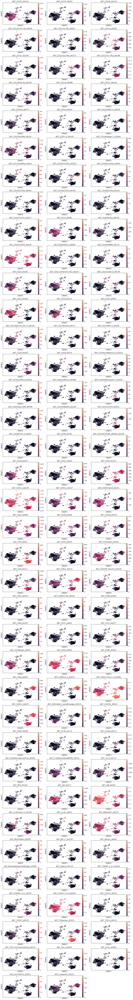

In [13]:
# Plot denoised protein expression
sc.pl.umap(
    post_adata, 
    color=post_adata.uns["totalVI_proteins"], 
    ncols=3, 

)

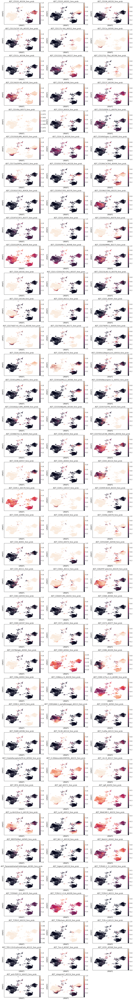

In [14]:
# Plot foreground probability
sc.pl.umap(
    post_adata,
    color=["{}_fore_prob".format(p) for p in post_adata.uns["totalVI_proteins"]],
    ncols=3,
)

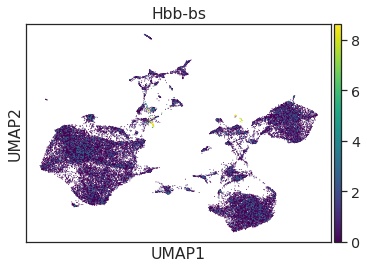

In [15]:
# Plot Hbb-bs gene

sc.pl.umap(
    post_adata, 
    color=["Hbb-bs"],
    ncols=2,
    #vmax = "p99.5",
    cmap = "viridis"
)

## Plot clusters to annotate

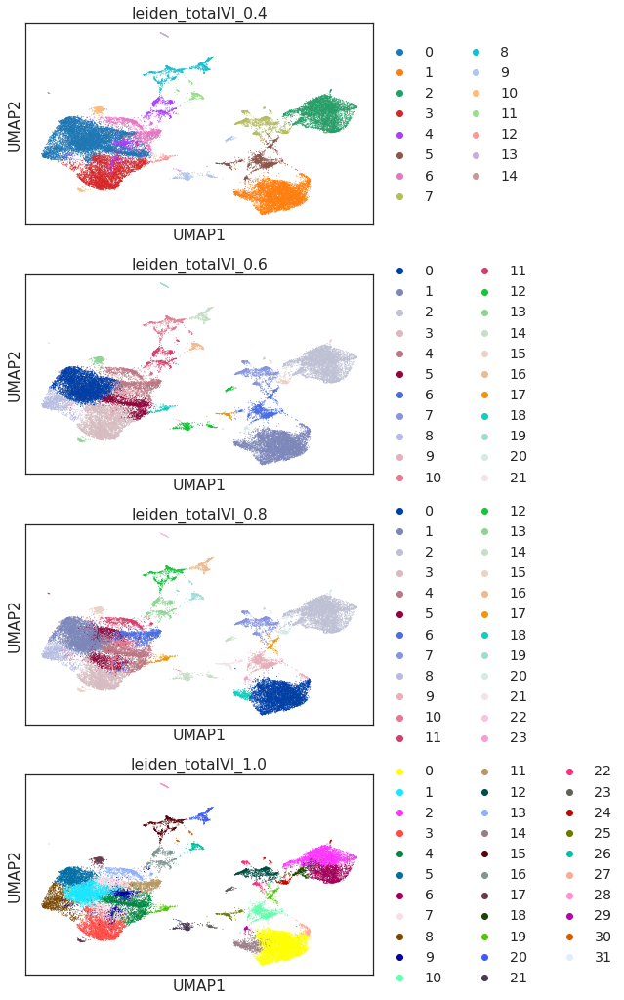

In [16]:
sc.pl.umap(
    post_adata, 
    color=["leiden_totalVI_0.4", "leiden_totalVI_0.6", "leiden_totalVI_0.8", "leiden_totalVI_1.0"],
    ncols=1
)

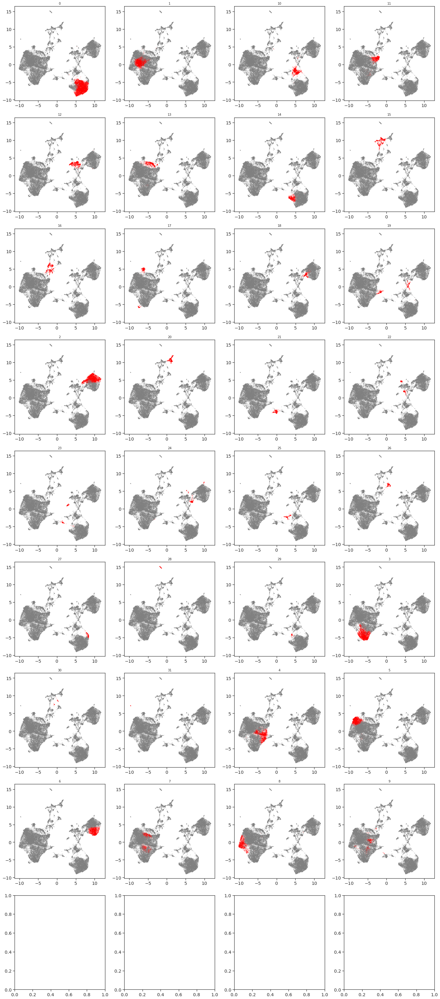

In [17]:
# Plot each cluster independently

fig, ax = plt.subplots(9, 4, figsize=(20, 45))
clusters = np.array((post_adata.obs["leiden_totalVI_1.0"])).ravel()
for c in range(len(np.unique(clusters))):
    ax.flat[c].scatter(x = post_adata.obsm["X_umap"][clusters==np.unique(clusters)[c]][:, 0], y = post_adata.obsm["X_umap"][clusters==np.unique(clusters)[c]][:, 1], s=.1,
                      c = "red")
    ax.flat[c].scatter(x = post_adata.obsm["X_umap"][clusters!=np.unique(clusters)[c]][:, 0], y = post_adata.obsm["X_umap"][clusters!=np.unique(clusters)[c]][:, 1], s=.1,
                      c = "grey")
    ax.flat[c].set_title(str(np.unique(clusters)[c]), fontsize = 10)

plt.tight_layout()

## Make annotations

Start with leiden clusters at res 1.0. Subcluster as necessary.

In [4]:
# Subcluster 12 into two clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_totalVI_1.0", ["12"]), key_added="leiden_NK_sub_0.1", resolution=0.1)

In [5]:
# Subcluster 20 into two clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_NK_sub_0.1", ["20"]), key_added="leiden_mono_sub_0.1", resolution=0.1)

In [6]:
# Subcluster 24 into three clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_mono_sub_0.1", ["24"]), key_added="leiden_RBC_sub_0.1", resolution=0.1)

In [7]:
# Subcluster 15 into three clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_RBC_sub_0.1", ["15"]), key_added="leiden_DC_sub_0.1", resolution=0.1)

In [8]:
# Subcluster 16 into four clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_DC_sub_0.1", ["16"]), key_added="leiden_MP_sub_0.2", resolution=0.2)

In [10]:
# Subcluster 10 into two clusters
sc.tl.leiden(post_adata, restrict_to = ("leiden_MP_sub_0.2", ["10"]), key_added="leiden_Treg_sub_0.2", resolution=0.2)

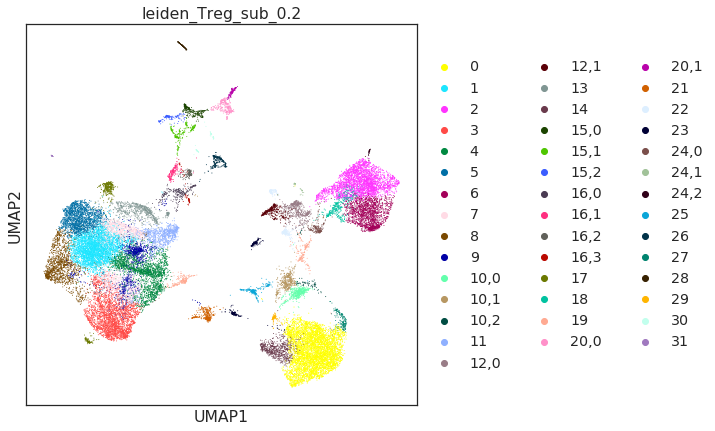

In [11]:
# Plot subclusterings

fig, ax = plt.subplots(figsize=(7, 7))
sc.pl.umap(
    post_adata, 
    color= ["leiden_Treg_sub_0.2"], #"leiden_mono_sub_0.1"
    #ncols=2, 
    ax = ax
)

In [12]:
# Make dictionary of annotations
annotations = {"0": "CD4 T cells",
              "1": "Mature B cells",
              "2": "CD8 T cells",
              "3": "Transitional B cells",
              "4": "Mature B cells",
              "5": "Mature B cells",
              "6": "CD122+ CD8 T cells",
              "7": "Mature B cells",
              "8": "Ifit3-high B cells",
              "9": "Mature B cells",
              "10,0": "Tregs",
              "10,1": "ICOS-high Tregs",
              "10,2": "Tregs",
              "11": "MZ B cells",
              "12,0": "NKT cells",
              "12,1": "NK cells",
              "13": "B1 B cells",
              "14": "Ifit3-high CD4 T cells",
              "15,0": "cDC2s",
              "15,1": "cDC1s",
              "15,2": "Migratory DCs",
              "16,0": "B-macrophage doublets",
              "16,1": "MZ/Marco-high macrophages",
              "16,2": "Red-pulp macrophages",
              "16,3": "Erythrocytes",
              "17": "Low quality B cells",
              "18": "Ifit3-high CD8 T cells",
              "19": "Cycling B/T cells", 
              "20,0": "Ly6-high monocytes",
              "20,1": "Ly6-low monocytes", 
              "21": "B doublets",
              "22": "GD T cells",
              "23": "T doublets",
              "24,0": "B-CD8 T cell doublets",
              "24,1": "Erythrocytes",
              "24,2": "Low quality T cells",
              "25": "B-CD4 T cell doublets",
              "26": "Neutrophils",
              "27": "Activated CD4 T cells",
              "28": "pDCs",
              "29": "Low quality T cells",
              "30": "Neutrophils",
              "31": "Plasma B cells"}

In [13]:
len(annotations)

43

In [14]:
annotations.values()

dict_values(['CD4 T cells', 'Mature B cells', 'CD8 T cells', 'Transitional B cells', 'Mature B cells', 'Mature B cells', 'CD122+ CD8 T cells', 'Mature B cells', 'Ifit3-high B cells', 'Mature B cells', 'Tregs', 'ICOS-high Tregs', 'Tregs', 'MZ B cells', 'NKT cells', 'NK cells', 'B1 B cells', 'Ifit3-high CD4 T cells', 'cDC2s', 'cDC1s', 'Migratory DCs', 'B-macrophage doublets', 'MZ/Marco-high macrophages', 'Red-pulp macrophages', 'Erythrocytes', 'Low quality B cells', 'Ifit3-high CD8 T cells', 'Cycling B/T cells', 'Ly6-high monocytes', 'Ly6-low monocytes', 'B doublets', 'GD T cells', 'T doublets', 'B-CD8 T cell doublets', 'Erythrocytes', 'Low quality T cells', 'B-CD4 T cell doublets', 'Neutrophils', 'Activated CD4 T cells', 'pDCs', 'Low quality T cells', 'Neutrophils', 'Plasma B cells'])

## Save annotation results

Save results as csv.

In [19]:
# Save the results in a dataframe: cluster number, label

annotation_sub = post_adata.obs["leiden_Treg_sub_0.2"]

In [20]:
labels = [annotations[c] for c in post_adata.obs["leiden_Treg_sub_0.2"]]

In [21]:
annot_df = pd.DataFrame({'leiden_subclusters': pd.Series(annotation_sub.values), 
                         'labels':pd.Series(labels)})

In [22]:
annot_df.to_csv("/data/yosef2/users/zsteier/totalVI/totalVI_journal/spleen_lymph_all/annotations/annotations_subclustered.csv")